<a href="https://colab.research.google.com/github/AybarsCebi/Crowd-Counting-with-Image-Processing/blob/main/AMRNet%20PartB%20Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models

class CBAMModule(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.channel_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.channel_max_pool = nn.AdaptiveMaxPool2d(1)
        self.shared_mlp = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction, bias=False),
            nn.ReLU(),
            nn.Linear(in_channels // reduction, in_channels, bias=False),
        )
        self.sigmoid_channel = nn.Sigmoid()
        self.spatial_conv = nn.Sequential(
            nn.Conv2d(2, 8, kernel_size=3, padding=1, bias=False),
            nn.ReLU(),
            nn.Conv2d(8, 1, kernel_size=3, padding=1, bias=False),
        )
        self.sigmoid_spatial = nn.Sigmoid()

    def forward(self, x):
        b, c, _, _ = x.size()
        avg = self.channel_avg_pool(x).view(b, c)
        mx  = self.channel_max_pool(x).view(b, c)
        avg_out = self.shared_mlp(avg).view(b, c, 1, 1)
        mx_out  = self.shared_mlp(mx ).view(b, c, 1, 1)
        x = x * self.sigmoid_channel(avg_out + mx_out)

        avg_sp = x.mean(dim=1, keepdim=True)
        mx_sp, _ = x.max(dim=1, keepdim=True)
        x = x * self.sigmoid_spatial(self.spatial_conv(torch.cat([avg_sp, mx_sp], dim=1)))
        return x

class AMRNet_ResNet50(nn.Module):
    def __init__(self):
        super().__init__()
        resnet = models.resnet50(
            pretrained=True,
            replace_stride_with_dilation=[False, False, True]
        )

        # İlk aşama
        self.initial = nn.Sequential(
            resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool
        )
        # Scale katmanları
        self.scale1 = resnet.layer1  # 256 kanallı
        self.scale2 = resnet.layer2  # 512 kanallı, ↓8
        self.scale3 = resnet.layer3  # 1024 kanallı, ↓16

        # Attention modüllerini kanal sayılarına göre ayarlayın
        self.att1 = CBAMModule(256)
        self.att2 = CBAMModule(512)
        self.att3 = CBAMModule(1024)

        # Auxiliary Heads for Deep Supervision
        self.head1 = nn.Conv2d(256, 1, kernel_size=1)
        self.head2 = nn.Conv2d(512, 1, kernel_size=1)
        self.head3 = nn.Conv2d(1024,1, kernel_size=1)

        # Fuse ve çıkış
        self.fusion_conv = nn.Conv2d(256 + 512 + 1024, 256, kernel_size=1)
        self.density_map = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 64,  kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64,   1,   kernel_size=1),
        )

    def forward(self, x):
        x = self.initial(x)
        x1 = self.att1(self.scale1(x))
        x2 = self.att2(self.scale2(x1))
        x3 = self.att3(self.scale3(x2))

        # Deep Supervision Maps
        d1 = F.interpolate(self.head1(x1), size=x1.shape[2:], mode='bilinear', align_corners=False)
        d2 = F.interpolate(self.head2(x2), size=x1.shape[2:], mode='bilinear', align_corners=False)
        d3 = F.interpolate(self.head3(x3), size=x1.shape[2:], mode='bilinear', align_corners=False)

        # Feature map’leri birleştir
        x2u = F.interpolate(x2, size=x1.shape[2:], mode='bilinear', align_corners=False)
        x3u = F.interpolate(x3, size=x1.shape[2:], mode='bilinear', align_corners=False)
        fused = torch.cat([x1, x2u, x3u], dim=1)
        fused = self.fusion_conv(fused)

        final = self.density_map(fused)
        if self.training:
            return final, (d1, d2, d3)
        return final


In [13]:
import scipy.io
import numpy as np
import cv2
import os

def generate_density_map(img_shape, points, sigma=15):
    """512x512 boyutunda yoğunluk haritası üretir."""
    density_map = np.zeros((512, 512), dtype=np.float32)

    for point in points:
        x, y = min(int(point[0]), 511), min(int(point[1]), 511)
        density_map[y, x] = 1  # Noktayı yerleştir

    density_map = cv2.GaussianBlur(density_map, (0, 0), sigma)
    if density_map.sum() > 0:
        density_map *= (len(points) / density_map.sum())  # Toplam kişi sayısını koru

    return density_map

# Veri seti yolları
data_path = "/content/drive/MyDrive/datasetB/train_data/images"
gt_path = "/content/drive/MyDrive/datasetB/train_data/ground_truth"
output_dir = "/content/drive/MyDrive/datasetB/train_data/density_maps"

os.makedirs(output_dir, exist_ok=True)

for img_file in os.listdir(data_path):
    if not img_file.startswith("IMG_") or not img_file.endswith(".jpg"):
        continue

    img_path = os.path.join(data_path, img_file)

    # Resim ismini ground truth dosyasına uygun hale getir
    img_number = img_file.replace("IMG_", "").replace(".jpg", "")
    gt_path_mat = os.path.join(gt_path, f"GT_IMG_{img_number}.mat")

    if not os.path.exists(gt_path_mat):
        print(f"Uyarı: {gt_path_mat} bulunamadı, atlanıyor.")
        continue

    # Ground truth noktalarını yükle
    mat = scipy.io.loadmat(gt_path_mat)
    points = mat["image_info"][0, 0][0, 0][0]  # (x, y) koordinatları

    # Görüntüyü oku ve 512x512 boyutuna getir
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    img_resized = cv2.resize(img, (512, 512))

    # Koordinatları yeniden ölçeklendir
    points_rescaled = points * [512 / w, 512 / h]

    # Yoğunluk haritası oluştur
    density_map = generate_density_map(img_resized.shape, points_rescaled)

    # .npy olarak kaydet
    npy_path = os.path.join(output_dir, img_file.replace("IMG_", "IMG_").replace(".jpg", ".npy"))
    np.save(npy_path, density_map)


In [6]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

IMG_HEIGHT = 512
IMG_WIDTH = 512

# Train
train_transform = A.Compose([
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=1.0),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
], additional_targets={'density_map': 'image'})

# Validation
val_transform = A.Compose([
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
], additional_targets={'density_map': 'image'})


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.6'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [24]:
class CrowdDataset(Dataset):
    def __init__(self, image_dir, density_dir, transform=None):
        self.image_dir = image_dir
        self.density_dir = density_dir
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith(".jpg")]
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        density_path = os.path.join(self.density_dir, self.image_files[idx].replace(".jpg", ".npy"))

        # Görüntüyü oku ve normalize et
        image = cv2.imread(img_path)
        image = cv2.resize(image, (512, 512))
        image = image.astype(np.float32) / 255.0  # Normalize et
        image = np.transpose(image, (2, 0, 1))  # PyTorch için (C, H, W) hale getir

        # Yoğunluk haritasını oku ve normalize et
        density_map = np.load(density_path).astype(np.float32)
        density_map = np.expand_dims(density_map, axis=0)  # (1, H, W) formatına getir

        return torch.tensor(image), torch.tensor(density_map)

# Dataset yolları
train_image_dir = "/content/drive/MyDrive/datasetB/train_data/images"
train_density_dir = "/content/drive/MyDrive/datasetB/train_data/density_maps"

val_image_dir = "/content/drive/MyDrive/datasetB/validation_data/images"
val_density_dir = "/content/drive/MyDrive/datasetB/validation_data/density_maps"


test_image_dir = "/content/drive/MyDrive/datasetB/test_data/images"
test_density_dir = "/content/drive/MyDrive/datasetB/test_data/density_maps"

# DataLoader oluştur
train_dataset = CrowdDataset(train_image_dir, train_density_dir, transform=train_transform)
val_dataset = CrowdDataset(val_image_dir, val_density_dir, transform=val_transform)
test_dataset = CrowdDataset(test_image_dir, test_density_dir)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader   = torch.utils.data.DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

In [25]:
# train_loader'dan bir batch alalım
images, densities = next(iter(train_loader))

print("Images shape:", images.shape)
print("Densities shape:", densities.shape)
print(len(train_loader))  # 0 çıkıyorsa veri gelmiyor!

images, densities = next(iter(train_loader))
print(images.shape, densities.shape)


Images shape: torch.Size([8, 3, 512, 512])
Densities shape: torch.Size([8, 1, 512, 512])
44
torch.Size([8, 3, 512, 512]) torch.Size([8, 1, 512, 512])


In [ ]:
import itertools
import torch
train_losses = []
val_losses = []
val_maes = []
val_mses = []

def grid_search(train_loader, val_loader, model_class, device,
                lr_values, wd_values, aux_weights,
                epochs=30, patience=10):
    """
    Hyperparametre grid search:
    - lr_values: list of learning rates
    - wd_values: list of weight_decay değerleri
    - aux_weights: list of auxiliary loss ağırlıkları
    """
    best_mae = float('inf')
    best_config = None
    results = []

    for lr, wd, aux_w in itertools.product(lr_values, wd_values, aux_weights):
        print(f"\n=== Testing config: lr={lr}, weight_decay={wd}, aux_weight={aux_w} ===")

        # Yeni model ve optimizer
        model = model_class().to(device)
        optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=wd)

        # Önceki run sonuçlarını temizle
        train_losses.clear()
        val_losses.clear()
        val_maes.clear()
        val_mses.clear()

        # Modeli eğit
        _, _, val_maes_run, _ = train_model(
            model, train_loader, val_loader,
            optimizer, device,
            epochs=epochs,
            patience=patience,
            aux_weight=aux_w
        )

        # En düşük validation MAE noktasına bak
        final_mae = min(val_maes_run)
        results.append((lr, wd, aux_w, final_mae))

        if final_mae < best_mae:
            best_mae    = final_mae
            best_config = (lr, wd, aux_w)
            print(f">>> New best config found with MAE = {best_mae:.2f}")

    # Özet
    print("\n=== Grid Search Summary ===")
    for lr, wd, aux_w, mae in results:
        print(f"lr={lr:.1e}, wd={wd:.1e}, aux={aux_w} -> best MAE={mae:.2f}")

    print(f"\n>>> Best Config: lr={best_config[0]}, "
          f"weight_decay={best_config[1]}, aux_weight={best_config[2]} "
          f"(MAE={best_mae:.2f})")

    return best_config, results

# Kullanım örneği:
lr_values   = [5e-5, 1e-5]
wd_values   = [1e-5, 1e-4]
aux_weights = [0.2, 0.3]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_cfg, all_results = grid_search(
    train_loader, val_loader,
    AMRNet_ResNet50, device,
    lr_values, wd_values, aux_weights,
    epochs=60, patience=15
)



=== Testing config: lr=5e-05, weight_decay=1e-05, aux_weight=0.2 ===
Epoch 1/60 | Train Loss: 0.0006 | Val Loss: 0.0000 | Val MAE: 304.65 | Val RMSE: 569.81
Epoch 2/60 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 405.56 | Val RMSE: 476.66
Epoch 3/60 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 211.79 | Val RMSE: 353.22
Epoch 4/60 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 164.23 | Val RMSE: 244.13
Epoch 5/60 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 260.00 | Val RMSE: 296.25
Epoch 6/60 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 156.72 | Val RMSE: 244.38
Epoch 7/60 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 296.09 | Val RMSE: 394.50
Epoch 8/60 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 187.07 | Val RMSE: 245.26
Epoch 9/60 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 152.76 | Val RMSE: 290.27
Epoch 10/60 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 207.90 | Val RMSE: 247.06
Epoch 11/60 | Train Loss: 0.0000 | Val Loss: 0.00

In [26]:
import torch
import torch.nn.functional as F

def compute_test_mae(model, test_loader, device):
    model.eval()
    model.to(device)

    mae_sum = 0.0
    with torch.no_grad():
        for images, densities in test_loader:
            images   = images.to(device)
            densities= densities.to(device)

            outputs = model(images)
            # Eğer tuple dönüyorsa, sadece nihai haritayı al
            if isinstance(outputs, tuple):
                outputs = outputs[0]

            # Boyutları eşitle
            if outputs.shape[-2:] != densities.shape[-2:]:
                outputs = F.interpolate(
                    outputs,
                    size=densities.shape[-2:],
                    mode='bilinear',
                    align_corners=False
                )

            # Her örnek için kişi sayısını hesapla
            pred_counts = outputs.sum(dim=[1,2,3])
            true_counts = densities.sum(dim=[1,2,3])

            # Mutlak farkları topla
            mae_sum += torch.abs(pred_counts - true_counts).sum().item()

    # Test setindeki toplam örnek sayısına bölerek ortalamayı al
    avg_mae = mae_sum / len(test_loader.dataset)
    return avg_mae




In [27]:
train_losses = []
val_losses = []
val_maes = []
val_mses = []


def train_model(model, train_loader, val_loader, optimizer, device, epochs=80, patience=10, aux_weight=0.2):
    best_val_mae = float('inf')
    patience_counter = 0
    criterion = nn.MSELoss()

    for epoch in range(epochs):
        model.train()
        train_loss = 0

        for images, densities in train_loader:
            images    = images.to(device)
            densities = densities.to(device)

            optimizer.zero_grad()

            outputs = model(images)

            if isinstance(outputs, tuple):
                final, (d1, d2, d3) = outputs
            else:
                final = outputs
                d1 = d2 = d3 = None

            if final.shape[-2:] != densities.shape[-2:]:
                final = F.interpolate(final, size=densities.shape[-2:], mode='bilinear', align_corners=False)

            loss_main = criterion(final, densities)

            loss_aux = 0
            if d1 is not None:
                for d in (d1, d2, d3):
                    d = F.interpolate(d, size=densities.shape[-2:], mode='bilinear', align_corners=False)
                    loss_aux += criterion(d, densities)

            total_loss = loss_main + aux_weight * loss_aux
            total_loss.backward()
            optimizer.step()
            train_loss += total_loss.item()

        # Validation
        model.eval()
        val_loss = 0
        val_mae = 0
        val_mse_sum = 0

        with torch.no_grad():
            for images, densities in val_loader:
                images    = images.to(device)
                densities = densities.to(device)

                outputs = model(images)
                if isinstance(outputs, tuple):
                    outputs, _ = outputs

                if outputs.shape[-2:] != densities.shape[-2:]:
                    outputs = F.interpolate(outputs, size=densities.shape[-2:], mode='bilinear', align_corners=False)

                loss = criterion(outputs, densities)
                val_loss += loss.item()

                pred_counts = outputs.sum(dim=[1, 2, 3])
                true_counts = densities.sum(dim=[1, 2, 3])
                val_mae += torch.abs(pred_counts - true_counts).sum().item()

                val_mse_sum += ((pred_counts - true_counts) ** 2).sum().item()

        N = len(val_loader.dataset)
        avg_train_loss = train_loss / len(train_loader)
        avg_val_loss   = val_loss   / len(val_loader)
        avg_val_mae    = val_mae    / N
        # RMSE = sqrt( MSE ) = sqrt( toplam_kare_hata / N )
        avg_val_rmse   = (val_mse_sum / N) ** 0.5

        print(f"Epoch {epoch+1}/{epochs} | "
              f"Train Loss: {avg_train_loss*10000:.4f} | "
              f"Val Loss: {avg_val_loss*10000:.4f} | "
              f"Val MAE: {avg_val_mae:.2f} | "
              f"Val RMSE: {avg_val_rmse:.2f}")

        if avg_val_mae <= best_val_mae:
            best_val_mae = avg_val_mae
            patience_counter = 0
            torch.save(model.state_dict(), "best_model.pt")
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered at epoch {epoch+1}.")
                break

        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)
        val_maes.append(avg_val_mae)
        val_mses.append(avg_val_rmse)

    return train_losses, val_losses, val_maes, val_mses


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AMRNet_ResNet50().to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4)
train_model(model, train_loader, val_loader, optimizer, device, epochs=120, patience=30, aux_weight=0.2)

model.load_state_dict(torch.load("best_model.pt"))
model.eval()
test_mae = compute_test_mae(model, test_loader, device)
print(f"Test MAE: {test_mae:.2f}")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/120 | Train Loss: 45.9768 | Val Loss: 13.4269 | Val MAE: 9566.34 | Val RMSE: 9567.42
Epoch 2/120 | Train Loss: 3.7222 | Val Loss: 0.3973 | Val MAE: 157.95 | Val RMSE: 197.50
Epoch 3/120 | Train Loss: 1.0601 | Val Loss: 0.2949 | Val MAE: 182.04 | Val RMSE: 207.32
Epoch 4/120 | Train Loss: 0.8313 | Val Loss: 0.2308 | Val MAE: 188.62 | Val RMSE: 209.35
Epoch 5/120 | Train Loss: 0.6965 | Val Loss: 0.1921 | Val MAE: 115.88 | Val RMSE: 140.64
Epoch 6/120 | Train Loss: 0.6044 | Val Loss: 0.1642 | Val MAE: 149.95 | Val RMSE: 168.35
Epoch 7/120 | Train Loss: 0.5291 | Val Loss: 0.1399 | Val MAE: 73.28 | Val RMSE: 97.44
Epoch 8/120 | Train Loss: 0.4721 | Val Loss: 0.1207 | Val MAE: 148.36 | Val RMSE: 161.68
Epoch 9/120 | Train Loss: 0.4224 | Val Loss: 0.1028 | Val MAE: 73.08 | Val RMSE: 94.34
Epoch 10/120 | Train Loss: 0.3811 | Val Loss: 0.0877 | Val MAE: 53.06 | Val RMSE: 72.22
Epoch 11/120 | Train Loss: 0.3449 | Val Loss: 0.0753 | Val MAE: 88.01 | Val RMSE: 103.12
Epoch 12/120 | Train L

In [28]:
def evaluate_model(model, test_loader, device):
    model.eval()
    model.to(device)

    mae = 0.0
    mse = 0.0

    with torch.no_grad():
        for images, densities in test_loader:
            images = images.to(device)
            densities = densities.to(device)

            outputs = model(images)

            if outputs.shape[-2:] != densities.shape[-2:]:
                outputs = F.interpolate(outputs, size=densities.shape[-2:], mode='bilinear', align_corners=False)

            for i in range(images.size(0)):
                img = images[i].cpu()
                gt_density = densities[i].squeeze(0).cpu().numpy()
                pred_density = outputs[i].squeeze(0).cpu().numpy()

                # Toplam kişi sayısı tahmini
                gt_count = gt_density.sum()
                pred_count = pred_density.sum()
                print("MAE: ", abs(pred_count - gt_count).item())
                mae += abs(pred_count - gt_count).item()
                mse += ((pred_count - gt_count)**2).item()

    num_samples = len(test_loader.dataset)
    mae /= num_samples
    mse /= num_samples
    rmse= mse**0.5

    return mae, rmse

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AMRNet_ResNet50().to(device)
model.load_state_dict(torch.load("best_model.pt"))
model.eval()
test_mae, test_rmse = evaluate_model(model, test_loader, device)
print(f"Test MAE: {test_mae:.2f} | Test RMSE: {test_rmse:.2f}")

MAE:  11.377700805664062
MAE:  4.039918899536133
MAE:  21.2783203125
MAE:  10.658721923828125
MAE:  4.815853118896484
MAE:  5.52587890625
MAE:  5.878086090087891
MAE:  18.229507446289062
MAE:  5.6302490234375
MAE:  5.721923828125
MAE:  44.631011962890625
MAE:  12.924896240234375
MAE:  14.875114440917969
MAE:  17.465351104736328
MAE:  16.68450164794922
MAE:  7.2069244384765625
MAE:  31.263839721679688
MAE:  0.028797149658203125
MAE:  12.368637084960938
MAE:  10.897701263427734
MAE:  20.013145446777344
MAE:  28.87933349609375
MAE:  69.20811462402344
MAE:  0.73675537109375
MAE:  8.926399230957031
MAE:  11.972793579101562
MAE:  36.562530517578125
MAE:  2.229248046875
MAE:  14.570510864257812
MAE:  2.687255859375
MAE:  25.709205627441406
MAE:  21.871524810791016
MAE:  5.6784210205078125
MAE:  14.551326751708984
MAE:  21.769554138183594
MAE:  1.6366729736328125
MAE:  4.187652587890625
MAE:  26.454238891601562
MAE:  8.63800048828125
MAE:  12.361625671386719
MAE:  9.9996337890625
MAE:  16.2517

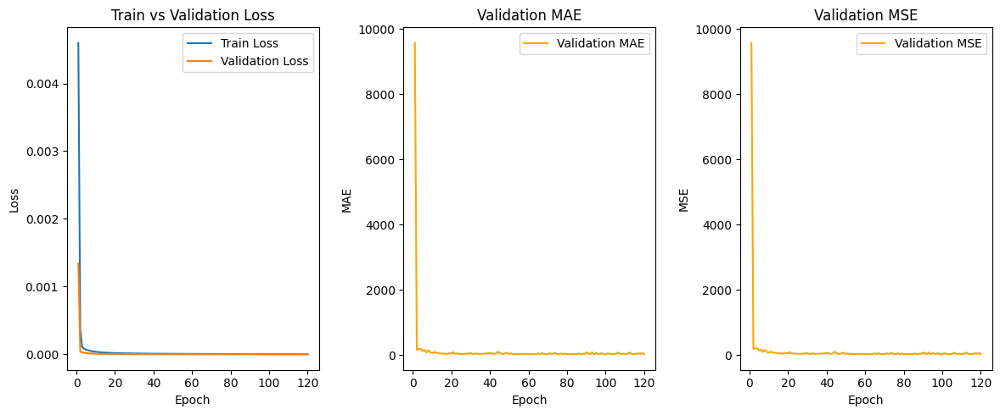

In [29]:
import matplotlib.pyplot as plt

epochs_range = range(1, len(train_losses)+1)

plt.figure(figsize=(12, 5))

# Loss Grafiği
plt.subplot(1, 3, 1)
plt.plot(epochs_range, train_losses, label="Train Loss")
plt.plot(epochs_range, val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train vs Validation Loss")
plt.legend()

# MAE Grafiği
plt.subplot(1, 3, 2)
plt.plot(epochs_range, val_maes, label="Validation MAE", color="orange")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title("Validation MAE")
plt.legend()

# MSE Grafiği
plt.subplot(1, 3, 3)
plt.plot(epochs_range, val_mses, label="Validation MSE", color="orange")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.title("Validation MSE")
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np

MEAN = np.array([0.485, 0.456, 0.406])
STD  = np.array([0.229, 0.224, 0.225])

def denormalize(img_tensor):
    # img_tensor: torch.Tensor [3,H,W], normalize edilmiş
    img = img_tensor.cpu().numpy().transpose(1,2,0)   # → H,W,3
    img = (img * STD) + MEAN                         # normalize'i ters çevir
    return np.clip(img, 0, 1)


Tahmini kişi sayısı: 2031.46


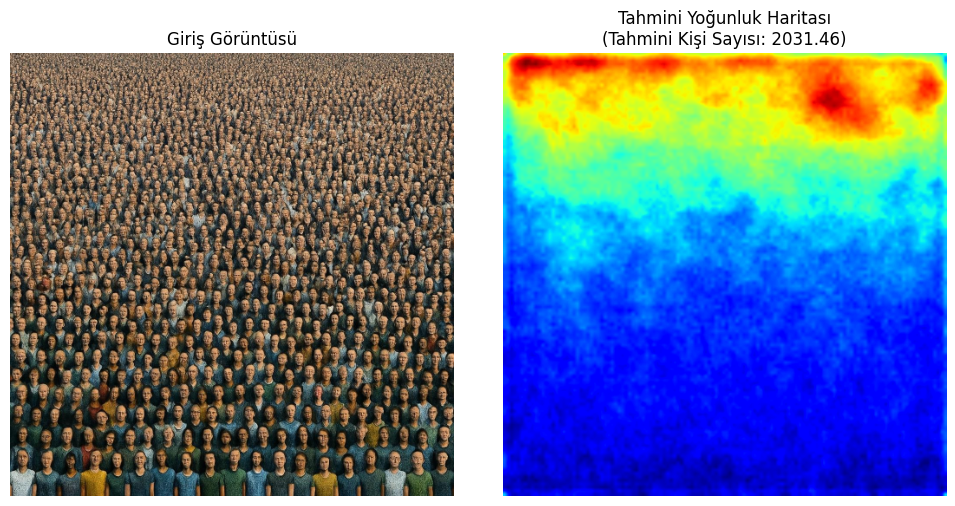

In [ ]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
import torch.nn.functional as F

def test_single_image(model, image_path, device):
    # Görüntüyü oku
    image = cv2.imread(image_path)
    image = cv2.resize(image, (512, 512))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Görselleştirme için

    # Normalize et ve tensor formatına getir
    image_tensor = image.astype(np.float32) / 255.0
    image_tensor = np.transpose(image_tensor, (2, 0, 1))  # (C, H, W)
    image_tensor = torch.tensor(image_tensor).unsqueeze(0).to(device)  # (1, C, H, W)

    # Model ile tahmin et
    model.eval()
    with torch.no_grad():
        output = model(image_tensor)
        output = F.interpolate(output, size=(512, 512), mode='bilinear', align_corners=False)
        density_map = output.squeeze().cpu().numpy()

    # Kişi sayısını yazdır
    count = density_map.sum()
    print(f"Tahmini kişi sayısı: {count:.2f}")

    # Görüntü ve yoğunluk haritasını göster
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title("Giriş Görüntüsü")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(density_map, cmap='jet')
    plt.title(f"Tahmini Yoğunluk Haritası\n(Tahmini Kişi Sayısı: {count:.2f})")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


image_path = "/content/WhatsApp Image 2025-05-04 at 00.20.41.jpeg"
test_single_image(model, image_path, device)

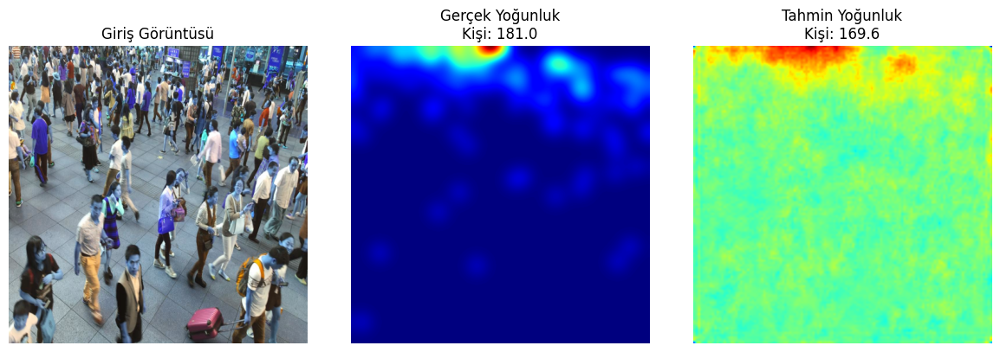

Difference:  11.377701


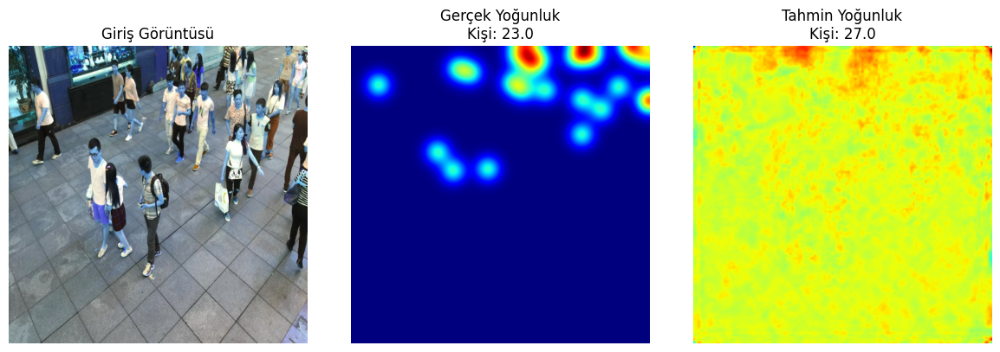

Difference:  4.039919


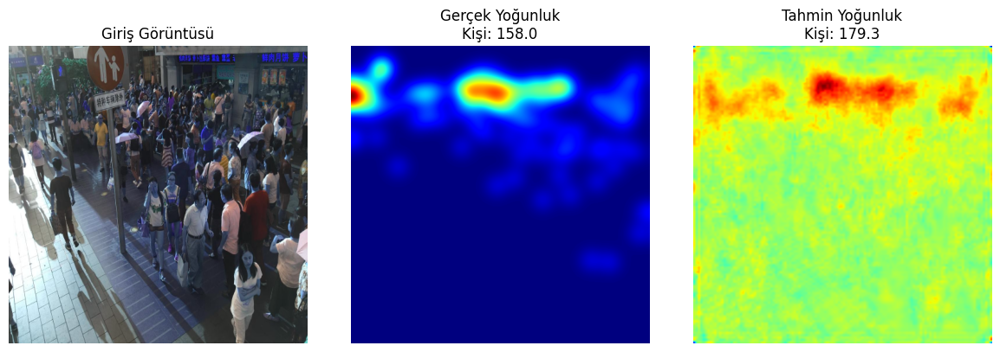

Difference:  21.27832


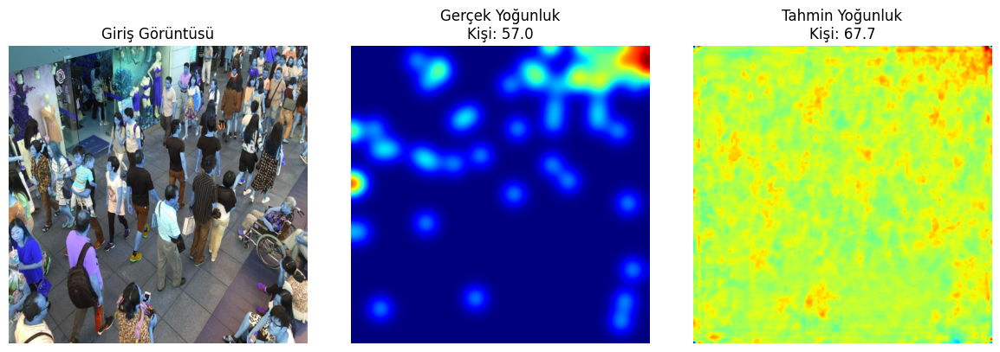

Difference:  10.658722


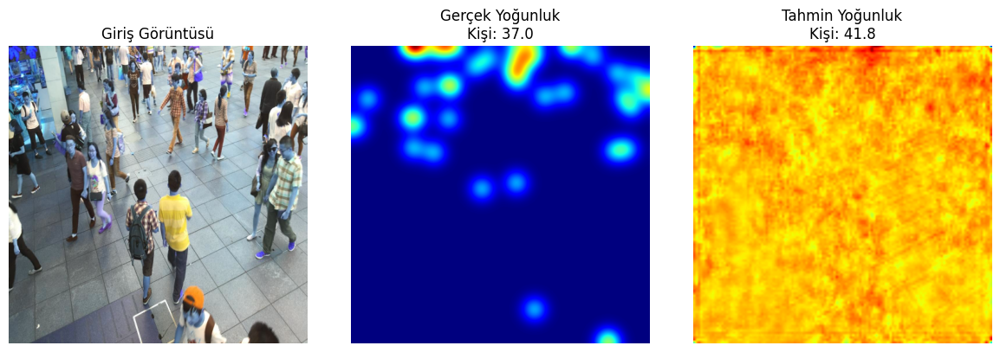

Difference:  4.815853


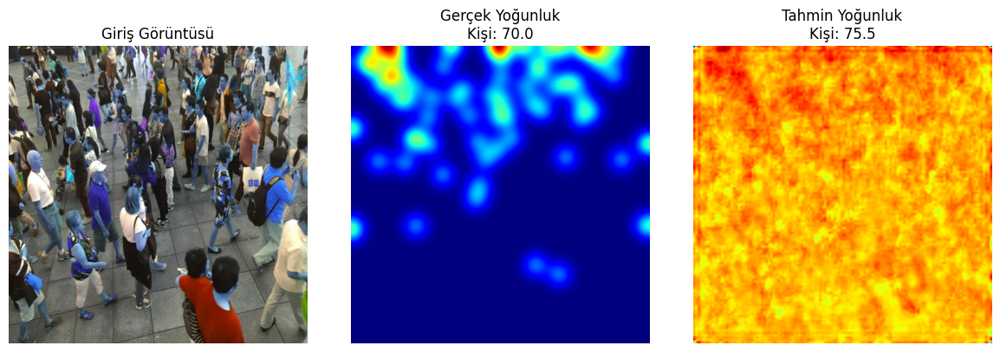

Difference:  5.525879


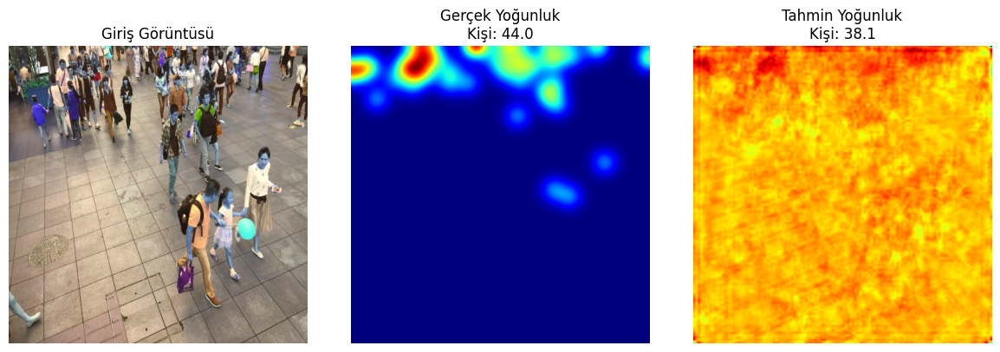

Difference:  5.878086


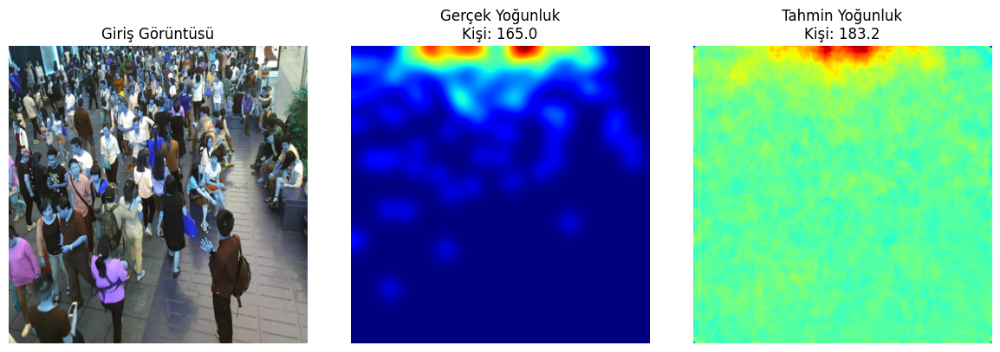

Difference:  18.229507


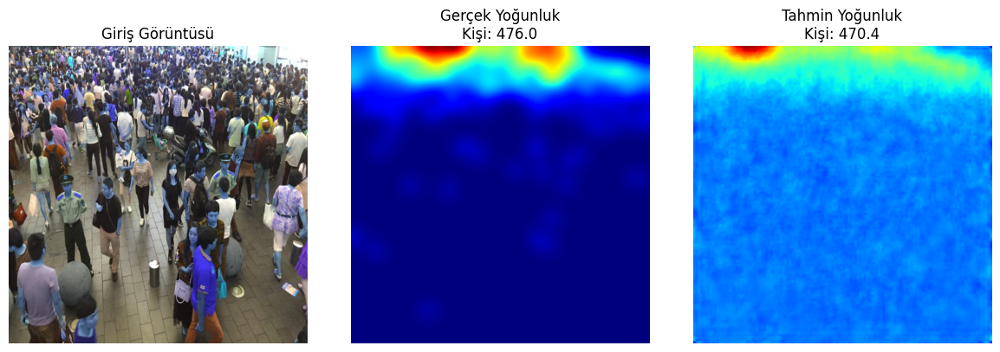

Difference:  5.630249


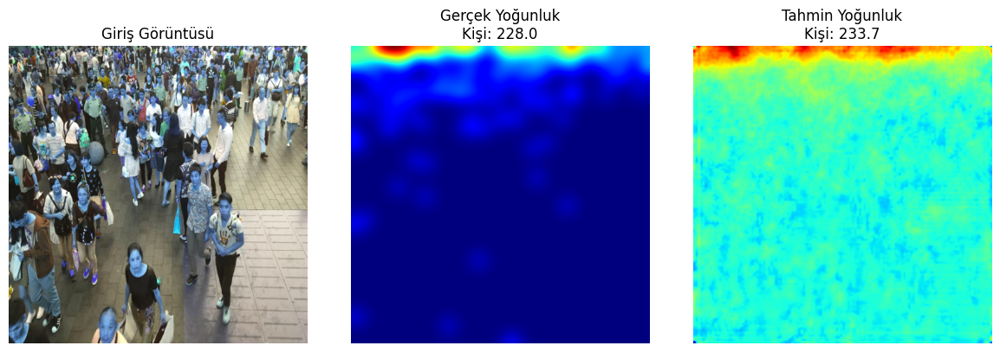

Difference:  5.721924


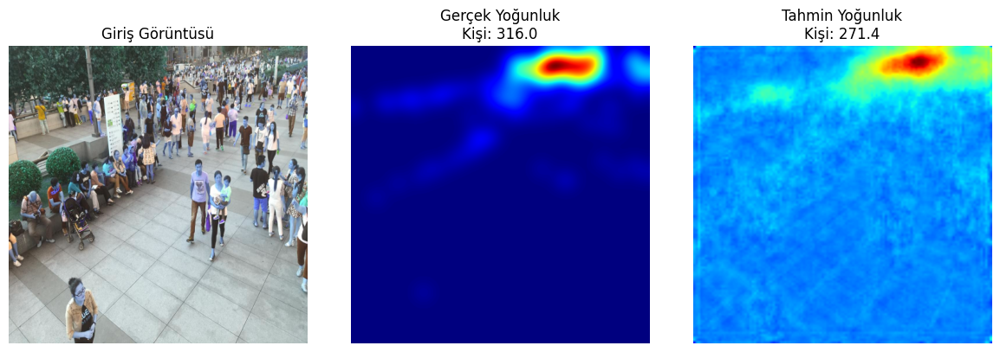

Difference:  44.631012


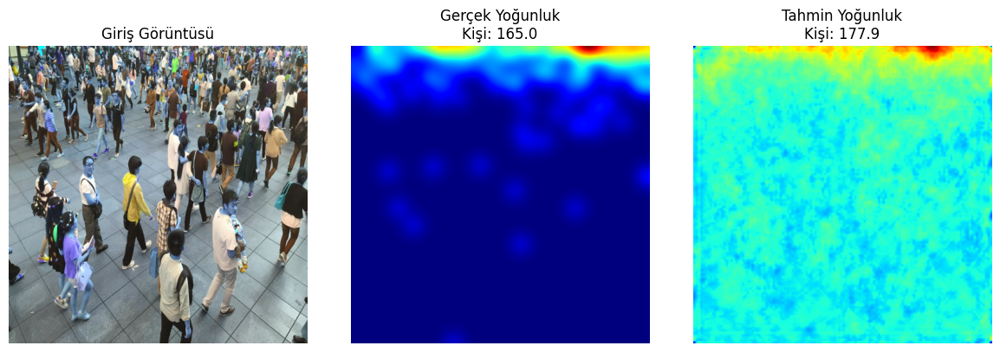

Difference:  12.924896


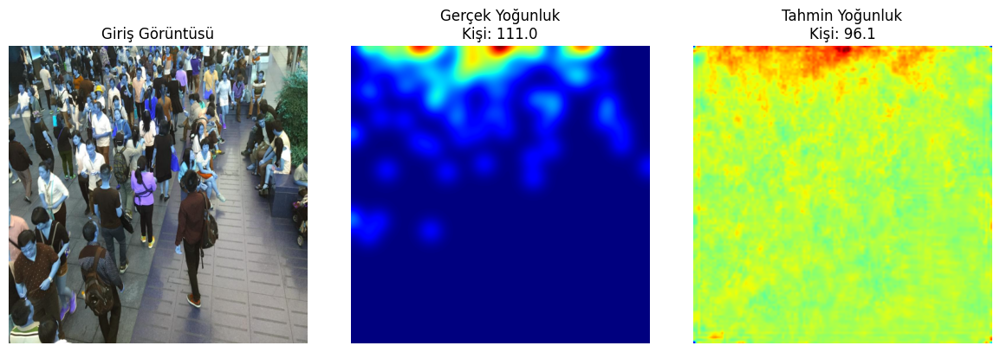

Difference:  14.875114


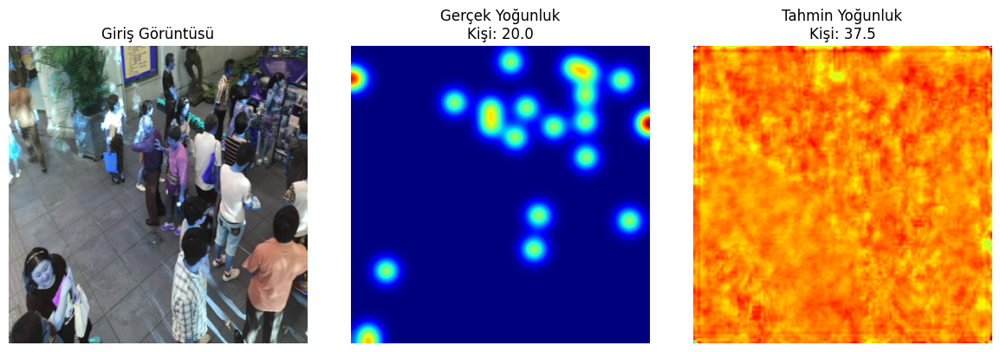

Difference:  17.465351


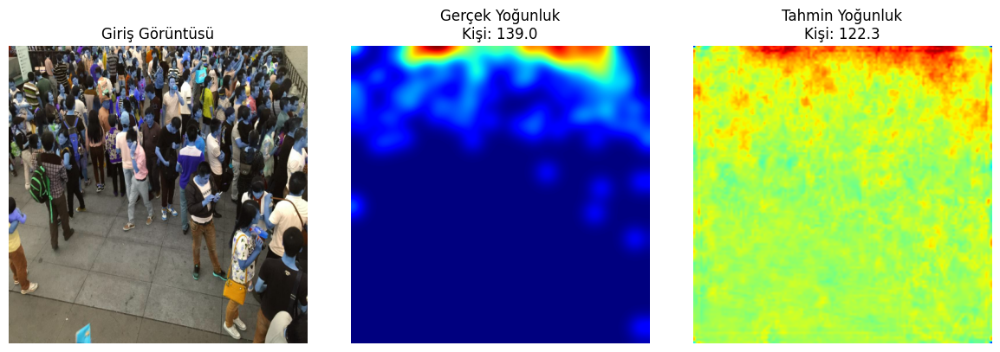

Difference:  16.684502


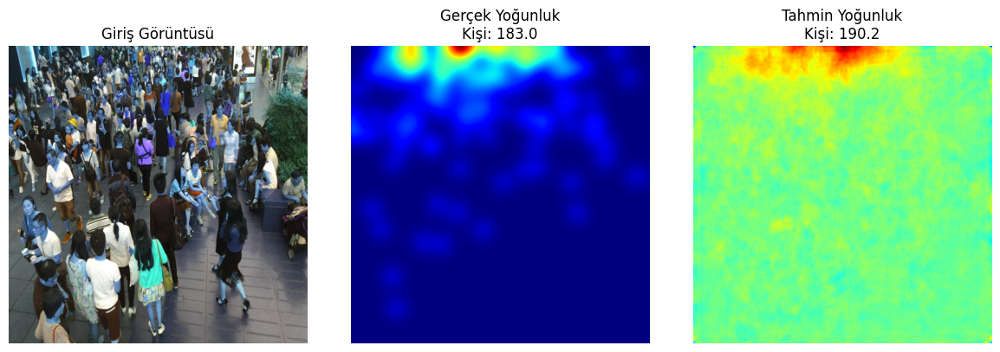

Difference:  7.2069244


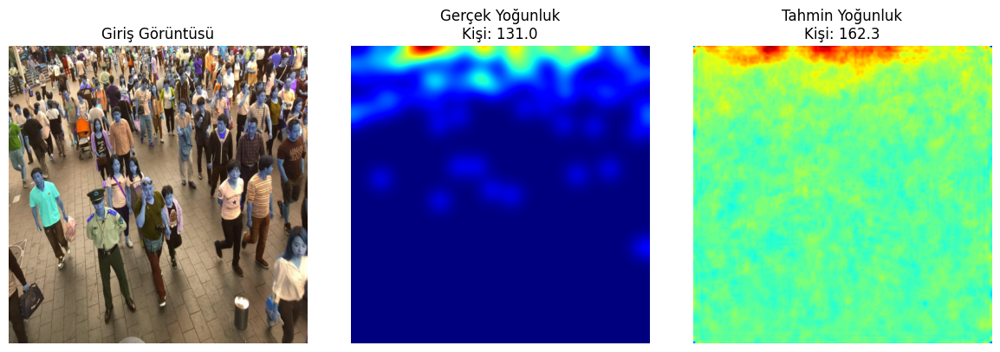

Difference:  31.26384


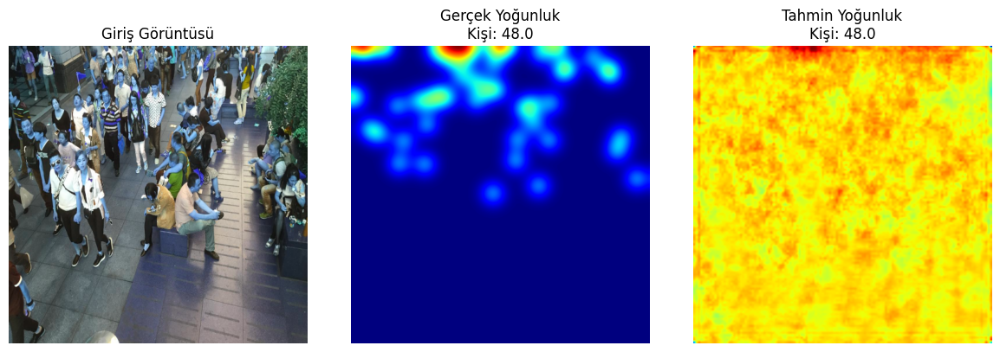

Difference:  0.02879715


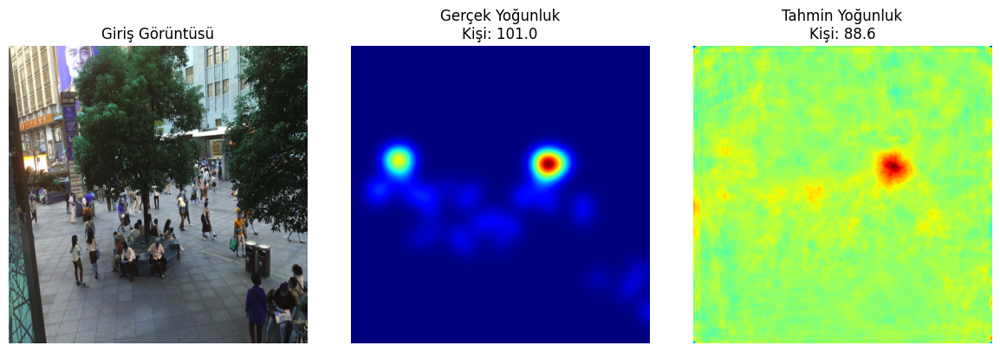

Difference:  12.368637


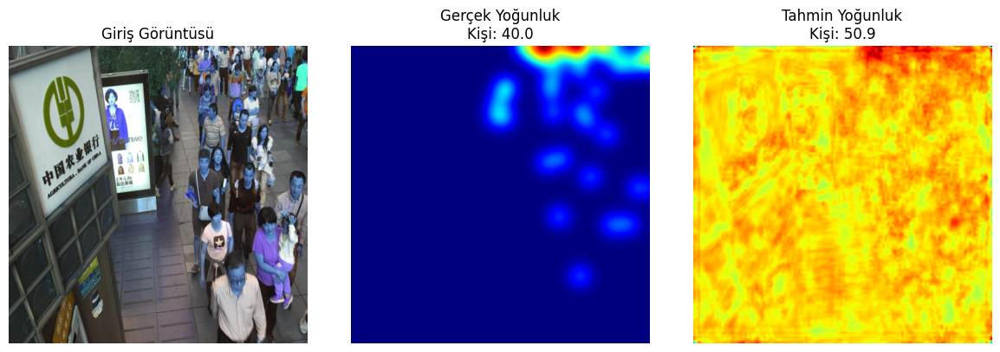

Difference:  10.897701


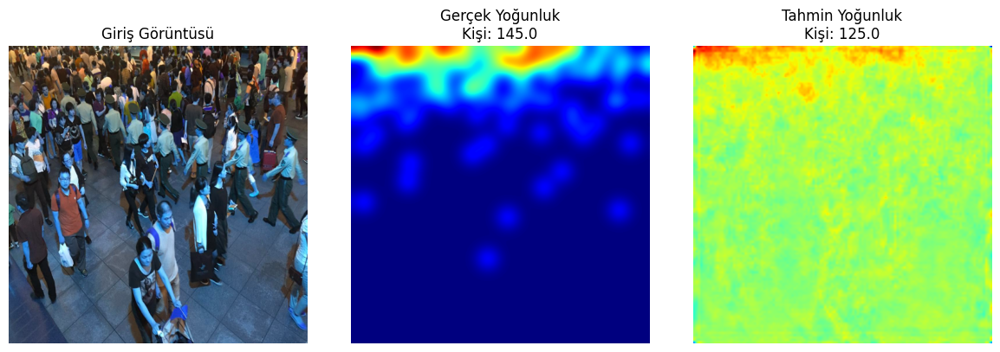

Difference:  20.013145


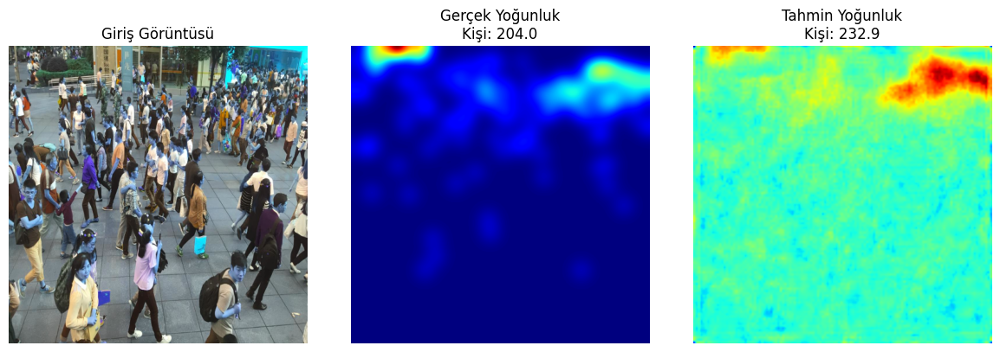

Difference:  28.879333


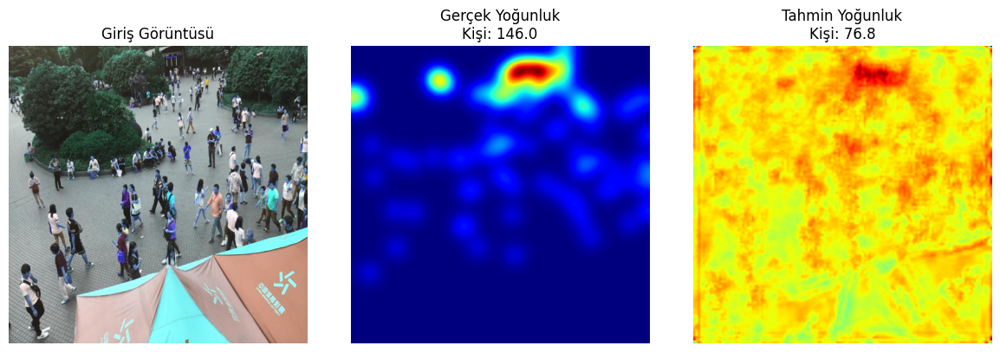

Difference:  69.208115


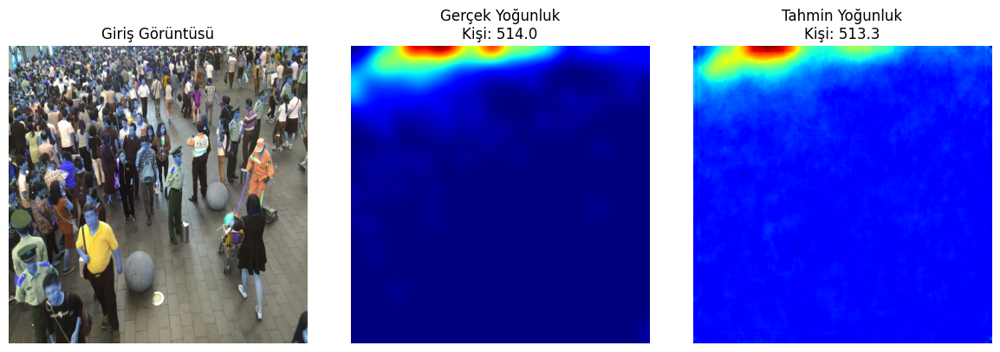

Difference:  0.7367554


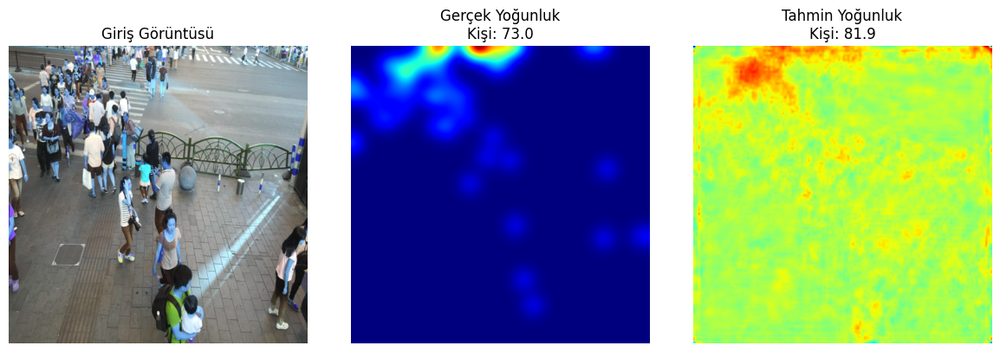

Difference:  8.926399


In [31]:
import torchvision.transforms.functional as TF

def visualize_predictions(model, dataloader, device, num_samples=5):
    model.eval()
    count = 0

    with torch.no_grad():
        for images, densities in dataloader:
            images = images.to(device)
            densities = densities.to(device)

            outputs = model(images)

            if outputs.shape[-2:] != densities.shape[-2:]:
                outputs = F.interpolate(outputs, size=densities.shape[-2:], mode='bilinear', align_corners=False)

            for i in range(images.size(0)):
                img = images[i].cpu()
                gt_density = densities[i].squeeze(0).cpu().numpy()
                pred_density = outputs[i].squeeze(0).cpu().numpy()

                # Toplam kişi sayısı tahmini
                gt_count = gt_density.sum()
                pred_count = pred_density.sum()

                # Görselleştir
                fig, axs = plt.subplots(1, 3, figsize=(12, 4))

                axs[0].imshow(TF.to_pil_image(img))
                axs[0].set_title("Giriş Görüntüsü")
                axs[0].axis("off")

                axs[1].imshow(gt_density, cmap='jet')
                axs[1].set_title(f"Gerçek Yoğunluk\nKişi: {gt_count:.1f}")
                axs[1].axis("off")

                axs[2].imshow(pred_density, cmap='jet')
                axs[2].set_title(f"Tahmin Yoğunluk\nKişi: {pred_count:.1f}")
                axs[2].axis("off")

                plt.tight_layout()
                plt.show()
                print("Difference: ",abs(gt_count-pred_count))
                count += 1
                if count >= num_samples:
                    return  # Belirtilen kadar örnek göster


# Model tahminlerini görselleştir
visualize_predictions(model, test_loader, device, num_samples=25)